In [ ]:
import functools
from typing import List, Tuple, Union

import torch
import segmentation_models_pytorch as smp
import numpy as np
import cv2

from matplotlib import pyplot as plt


In [ ]:
smp.create_model(
    arch='unet',
    encoder_name='swin_base_patch4_window7_224',
    encoder_weights='imagenet',
    in_channels=3,
    classes=1
)

# Configuration

In [38]:
class CFG:
    def __init__(self, kappa: float = 2, p: float = 0.3, eta_T: float = 0.999, T: int = 1000):
        self.kappa = kappa
        self.p = p
        self.eta_1 = min(0.001, (0.04 / self.kappa)**2)
        self.eta_T = eta_T
        self.T = T

config = CFG()

config.__dict__


{'kappa': 2, 'p': 0.3, 'eta_1': 0.0004, 'eta_T': 0.999, 'T': 1000}

# Noise Scheduling Parameters
> Noise Scheduler ResShift see [Arxiv](https://arxiv.org/pdf/2307.12348)
We have:
$$
    b_0 = \exp \left[ \frac{1}{2(T-1)} \log{\frac{\eta_T }{ \eta_1}} \right]
$$

$$
    \beta_t = \left( \frac{t-1}{T-1} \right)^{p} (T - 1)
$$
Now, we can compose the noise scaling factor as:
$$
    \eta_t = \eta_1 \times b_0^{2\beta_t}
$$

Also, to recover the original noise scaling factor, we can use:
$$
    \alpha_t =  \eta_t - \eta_{t-1} \qquad \text{for } t > 1
$$
and 
$$
    \alpha_1 = \eta_1
$$

In [52]:
import functools

@functools.lru_cache(maxsize=1000)
def get_b_0(config):
    """ returns the value of b_0 """
    return torch.exp(
        1 / (2 * config.T - 2) * torch.log(
            torch.tensor(config.eta_T / config.eta_1)
        )
    )

@functools.lru_cache(maxsize=1000)
def get_beta_t(t, config):
    """ returns the value of beta_t """
    return (
        (t - 1) / (config.T - 1)
    ) ** config.p * (config.T - 1)


@functools.lru_cache(maxsize=1000)
def get_eta_t(t, config):
    """ returns the value of eta_t """
    b_0 = get_b_0(config)
    beta_t = get_beta_t(t, config)
    return config.eta_1 * b_0 ** (beta_t * 2)

@functools.lru_cache(maxsize=1000)
def get_alpha_t(t, config):
    """ returns the value of alpha_t """
    return get_beta_t(t, config) - get_beta_t(t - 1, config)


@functools.lru_cache(maxsize=1000)
def get_loss_coef(t, config):
    """ returns the value of loss coef """
    return get_alpha_t(t, config) / (
        2 * (config.kappa ** 2) * get_eta_t(t, config) * get_eta_t(t - 1, config)
    )


### sanity check
assert np.isclose(get_beta_t(1, config), 0.0), "The beta value at t=1 is expected to be 0"
assert np.isclose(get_beta_t(config.T, config), config.T, rtol=1e-2), "The beta value at t=T is expected to be T"

# Noise Scheduling Visualization


100%|██████████| 1000/1000 [00:00<00:00, 999119.58it/s]


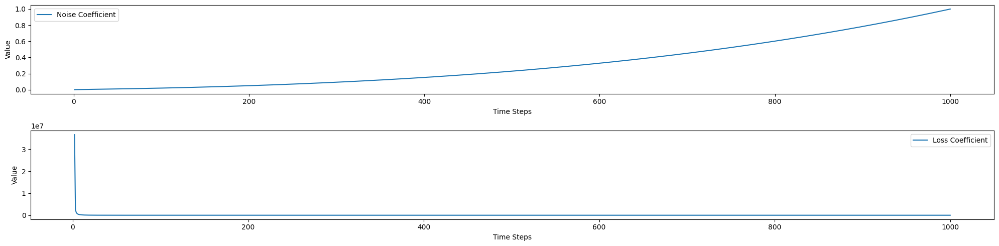

In [56]:
import numpy as np
from tqdm import tqdm
from matplotlib import pyplot as plt

time_steps = np.arange(1, config.T + 1)
noise_coef = np.array([get_eta_t(t, config) for t in tqdm(time_steps)])
loss_coef = np.array([get_loss_coef(t, config) for t in tqdm(time_steps)])

fig, ax = plt.subplots(2, 1, figsize=(20, 5))
ax[0].plot(time_steps, noise_coef, label="Noise Coefficient")
ax[0].set_xlabel("Time Steps")
ax[0].set_ylabel("Value")
ax[0].legend()

ax[1].plot(time_steps, loss_coef, label="Loss Coefficient")
ax[1].set_xlabel("Time Steps")
ax[1].set_ylabel("Value")
ax[1].legend()

plt.tight_layout()
plt.show()

# Noise Scheduling Implementation


In [81]:

def get_noisy_image(t, image_original, image_traget, config):
    """ returns the noisy image at time step t """
    eta_t = get_eta_t(t, config)

    # generate noise
    noise = torch.randn(image_original.shape)
    # scheduled noise 
    noise = config.kappa * torch.sqrt(eta_t) * noise

    # residual image e_0
    residual_image = image_traget - image_original
    # scheduled residual image
    residual_image = eta_t * residual_image

    # noisy image
    noisy_image = image_original + residual_image + noise

    return noisy_image

100%|██████████| 8/8 [00:00<00:00, 423.20it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13765681..1.1487643].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3707154..2.4286084].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.5935557..3.5454824].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.3735297..4.190251].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.8071957..5.5022707].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.593307..6.839377].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or

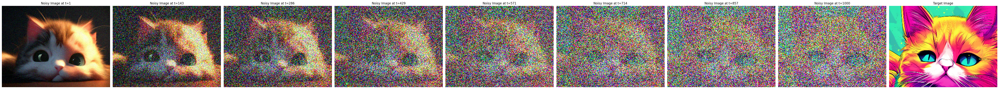

100%|██████████| 8/8 [00:00<00:00, 413.28it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0683429..0.067060485].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45762968..0.49574232].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.82410944..0.7251339].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.1160836..1.1336014].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.439414..1.416951].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8567003..1.6426061].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floa

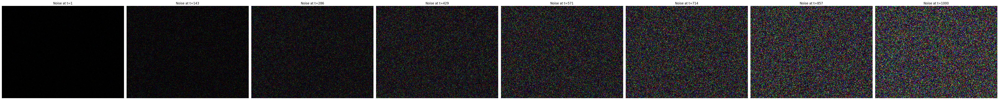

In [86]:
import cv2


time_steps = np.linspace(1, config.T, 8).astype(int)


image_original = cv2.imread("../Images/cute_cat_3d.png")
image_traget = cv2.imread("../Images/cute_cat_manga.png")

image_original = torch.tensor(image_original).float() / 255
image_traget = torch.tensor(image_traget).float() / 255

noisy_images = []
for t in tqdm(time_steps):
    noisy_image = get_noisy_image(t, image_original, image_traget, config)
    noisy_images.append(noisy_image)


fig, ax = plt.subplots(1, len(time_steps) + 1, figsize=(len(time_steps) * 6 + 6, 6))

for i, t in enumerate(time_steps):
    ax[i].imshow(cv2.cvtColor(noisy_images[i].numpy(), cv2.COLOR_BGR2RGB))
    ax[i].set_title(f"Noisy Image at t={t}")
    ax[i].axis("off")


ax[-1].imshow(cv2.cvtColor(image_traget.numpy(), cv2.COLOR_BGR2RGB))
ax[-1].set_title("Target Image")
ax[-1].axis("off")

plt.tight_layout()
plt.show()


noises = []
for t in tqdm(time_steps):
    noise = get_noisy_image(t, image_original, image_traget, config) - get_noisy_image(t + 1, image_original, image_traget, config)
    noises.append(noise)

fig, ax = plt.subplots(1, len(time_steps), figsize=(len(time_steps) * 6 + 6, 6))

for i, t in enumerate(time_steps):
    ax[i].imshow(cv2.cvtColor(noises[i].numpy(), cv2.COLOR_BGR2RGB)/ 5)
    ax[i].set_title(f"Noise at t={t}")
    ax[i].axis("off")

plt.tight_layout()
plt.show()


